# Описание проекта
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.  
Для начала они просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.  
Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.  
# Данные
Файл `moscow_places.csv`:  
`name` — название заведения;  
`address` — адрес заведения;  
`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
`hours` — информация о днях и часах работы;  
`lat` — широта географической точки, в которой находится заведение;  
`lng` — долгота географической точки, в которой находится заведение;  
`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  
`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:  
«Средний счёт: 1000–1500 ₽»;  
«Цена чашки капучино: 130–220 ₽»;  
«Цена бокала пива: 400–600 ₽».  
и так далее;  
`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»:  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.  
`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино»:  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.  
`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки);  
`district` — административный район, в котором находится заведение, например Центральный административный округ;  
`seats` — количество посадочных мест.

# 1. Загружаем и изучаем информацию

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import math
import re
import matplotlib
import matplotlib.pyplot as plt
import folium
data = pd.read_csv('/datasets/moscow_places.csv') # открываем файл
data.info() #  получаем информацию о файле
display(data.head(10)) # выводим первые 10 строк data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


# 2. Выполняем предобратобку данных.

In [ ]:
display(data.isna().sum()) # ищем пропущенные значения
pd.DataFrame(round(data.isna().mean()*100,)).style.background_gradient('coolwarm') # выводим % пропусков

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.000000
lat,0.000000
lng,0.000000
rating,0.000000
price,61.000000
avg_bill,55.000000


Достаточно большая доля пропущенных значений в столбцах price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.
Удалять не стоит, это будет существенно влиять на результат.

In [ ]:
 # проверяем на наличие явные дубликатов
print('Явных дубликатов:', data.duplicated().sum())

Явных дубликатов: 0


In [ ]:
#data['category'].unique()
#set(data['name'])
#print('Уникальные наименования заведений:\n', sorted(data['address'].unique()))
#print('Количество неявных дубликатов по столбцу address -', data['address'].duplicated().sum())
data['name'] = data['name'].str.lower() #приводим названия к строчным буквам
data = data.drop_duplicates(subset=['name', 'address']).reset_index() # удаляем дубликаты по названию и адресу
data[data.duplicated(subset=['name', 'address'], keep = False)] # проверяем

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Заполняем пропущенные значения по среднему чеку. В качестве значения берем медиану по району.

In [ ]:
# заполняем медианой пропущенные значения:
data['middle_avg_bill'] = data['middle_avg_bill'].fillna(data.groupby(['district', 'category'])['middle_avg_bill'].transform('median'))
display(data.head())

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,550.0,NaN,0,NaN
1,1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,325.0,170.0,0,NaN
4,4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Добавляем новый столбец с названиями улиц

In [ ]:
data['street'] = data['address'].apply(lambda x:x.split(',')[1])
data.head()

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,550.0,NaN,0,NaN,улица Дыбенко
1,1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,325.0,170.0,0,NaN,улица Маршала Федоренко
4,4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


Создаем столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
    логическое значение True — если заведение работает ежедневно и круглосуточно;
    логическое значение False — в противоположном случае.

In [ ]:
data['is_24/7'] = np.where(data['hours'] == 'ежедневно, круглосуточно', 'True', 'False')
display(data.head())

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,550.0,NaN,0,NaN,улица Дыбенко,False
1,1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,325.0,170.0,0,NaN,улица Маршала Федоренко,False
4,4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [ ]:
# для наглядности заменим значения сетевых заведений
data.loc[data['chain'] == 1, 'chain'] = 'да'
data.loc[data['chain'] == 0, 'chain'] = 'нет'
display(data.head())

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,550.0,NaN,нет,NaN,улица Дыбенко,False
1,1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,нет,4.0,улица Дыбенко,False
2,2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,нет,45.0,Клязьминская улица,False
3,3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,325.0,170.0,нет,NaN,улица Маршала Федоренко,False
4,4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,да,148.0,Правобережная улица,False


# 3. Анализ данных

**3.1. Исследуем категории заведений**

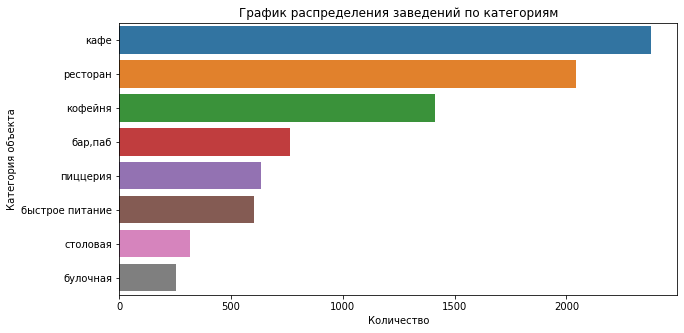

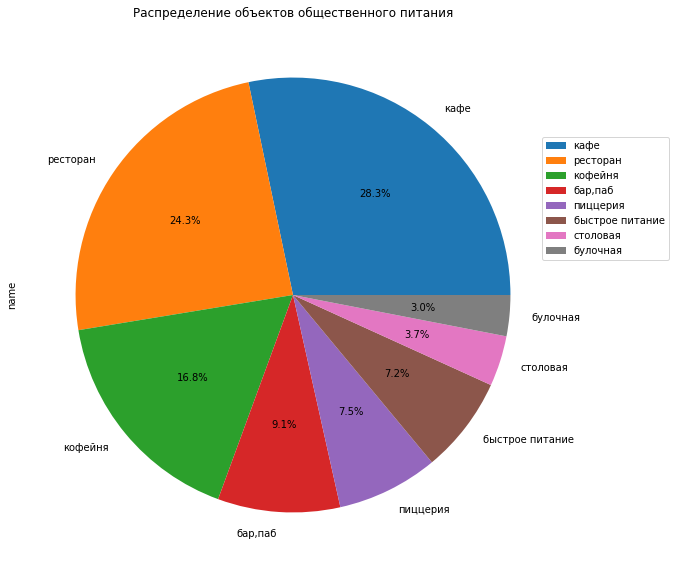

,Категория заведения,Количество
3,кафе,2377
6,ресторан,2042
4,кофейня,1413
0,"бар,паб",764
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


In [ ]:
# выводим количество заведений по категориям:
data_category = data.groupby('category')['name'].count().reset_index()
data_category = data_category.sort_values(by='name', ascending=False)
data_category.rename(columns={'name':'count'}, inplace=True)
# строим график распределения заведений по категориям:
plt.figure(figsize=(10, 5)) # Размер графика
plt.title('График распределения заведений по категориям') # Название графика
sns.barplot(x='count', y='category', data=data_category).set(ylabel='Категория объекта', xlabel='Количество')
plt.show()
# строим круговую диаграмму распределения заведений по категориям:
data.groupby(by='category').agg({'name':'count'}).sort_values(by='name', ascending=False).plot(y="name", kind="pie", figsize=(10, 10), autopct='%1.1f%%')
plt.legend(bbox_to_anchor=(0.6, 0, 0.6, 0.8)) # Расположение легенды на графике
plt.title('Распределение объектов общественного питания') # Название графика
plt.show()
data_category.rename(columns={'category':'Категория заведения', 'count':'Количество'}, inplace=True)
#data_category = data_category.sort_values(by='Количество', ascending=False)
display(data_category)

Вывод: Наибольшее количество заведений составляют кафе - 28,3%, в сумме с ресторанами эти заведения составляют более 50% (52,6%) от общего числа заведений.

**3.2. Исследуем количество посадочных мест.**

,Категория заведения,Медиана посадочных мест
6,ресторан,86.0
0,"бар,паб",82.0
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


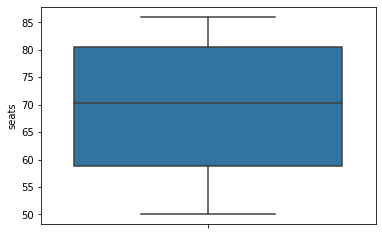

In [ ]:
data_seats = data.groupby('category')['seats'].median().reset_index().sort_values(by='seats', ascending=False)
# строим boxplot
sns.boxplot(y = 'seats', data = data_seats)
data_seats.rename(columns={'category':'Категория заведения', 'seats':'Медиана посадочных мест'}, inplace=True)
display(data_seats)

Вывод: Медиана посадочных мест от заведения к заведению значительно не отличается. Максимальная медиана у ресторанов  - 86, затем бар\паб - 82 и кофейня - 80. Общая медиана состаляет 70 посадочных мест.

**3.3.Считаем количество сетевых и несетевых заведений**

,chain,name
0,да,3203
1,нет,5200


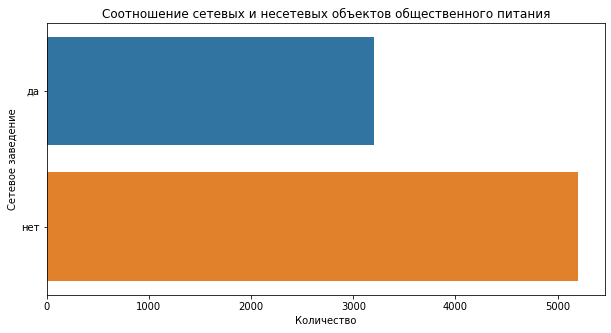

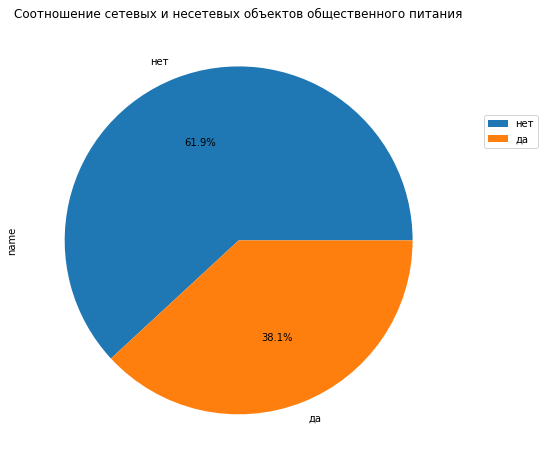

,Сетевое заведение,Количество
0,да,3203
1,нет,5200


In [ ]:
data_chain = data.groupby('chain').agg({'name':'count'}).reset_index()
display(data_chain)
# Строим график сетевых и несетевых заведений:
plt.figure(figsize=(10, 5)) # Размер графика
plt.title('Соотношение сетевых и несетевых объектов общественного питания') # Название графика
sns.barplot(x='name', y='chain', data=data_chain).set(ylabel='Сетевое заведение', xlabel='Количество')
plt.show()
# Строим отношение сетевых и несетевых заведений:
data.groupby(by='chain').agg({'name':'count'}).sort_values(by='name', ascending=False).plot(y="name", kind="pie", figsize=(8, 8), autopct='%1.1f%%')
#data_chain.plot(y="name", kind="pie", figsize=(8, 8), autopct='%1.1f%%')
plt.legend(bbox_to_anchor=(0.6, 0, 0.6, 0.8)) # Расположение легенды на графике
plt.title('Соотношение сетевых и несетевых объектов общественного питания') # Название графика
plt.show()
data_chain = data_chain.rename(columns={'chain':'Сетевое заведение', 'name':'Количество'})
display(data_chain)

Вывод: Количество несетевых заведений составляет 61,9% от общего количества заведений.

**3.4. Зависимость категорий и сетевых заведений**

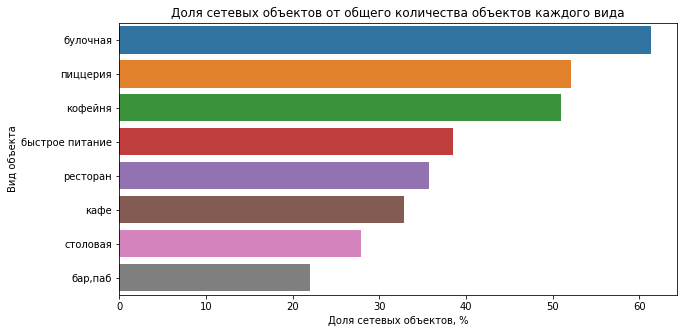

,Категория заведения,Количество,Доля сетевых заведений
1,булочная,157,61.3
5,пиццерия,330,52.1
4,кофейня,720,51.0
2,быстрое питание,232,38.5
6,ресторан,729,35.7
3,кафе,779,32.8
7,столовая,88,27.9
0,"бар,паб",168,22.0


In [ ]:
# Выбираем объекты питания по сетевой принадлежности и виду объекта и считаем их количество
data_chain_yes = data.groupby(['category', 'chain']).agg({'name':'count'}).sort_values(by='category').query('chain == "да"')
#display(data_chain_yes.head()) # проверяем результат
# Группируем объекты питания по виду объекта и считаем их количество
total_category = data.groupby('category').agg({'name':'count'}).sort_values(by='category')
#display(total_category.head()) # проверяем результат
# Считаем процент сетевых объектов от общего количества
data_chain_yes['percent_chain'] = round(data_chain_yes['name'] / total_category['name'] * 100, 1)
data_chain_yes = data_chain_yes.reset_index().sort_values(by='percent_chain', ascending=False)
#display(data_chain_yes.head()) # проверяем результат
# Строим гистограмму распределения сетевых объектов питания
plt.figure(figsize=(10, 5)) # Размер графика
plt.title('Доля сетевых объектов от общего количества объектов каждого вида') # Название графика
sns.barplot(x='percent_chain', y='category', data=data_chain_yes).set(ylabel='Вид объекта', xlabel='Доля сетевых объектов, %')
plt.show()
# Выводим статистику:
data_chain_yes.columns = ['Категория заведения', 'Сетевое заведение', 'Количество', 'Доля сетевых заведений']
display(data_chain_yes[['Категория заведения', 'Количество', 'Доля сетевых заведений']])

Вывод: Наиболее распространенные категории заведений общественного питания это булочные - 61,3%, пиццерии - 52,1%, кофейни - 51%.  
Наименьшая доля сетевых заведений у баров\пабов - 22% и столовых - 27,9%.

**3.5. Топ 15 сетей в Москве**

In [ ]:
#определяем 15 самых крупных сетевых заведений
data_chain_y = data.query('chain == "да"')
data_top_rest = data_chain_y.pivot_table(index = ['name', 'category'], values = 'address', aggfunc = 'count').reset_index()
data_top_rest = data_top_rest.sort_values(by = 'address', ascending = False)[:15]
px.bar(data_top_rest, x = 'name', y = 'address', title = 'Самые крупные сетевые заведения')
data_top15_rest = data_top_rest['name'] # список топ заведений
display(data_top_rest)

,name,category,address
1126,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1142,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


Отображаем TOP-15 заведений по районам

In [ ]:
data_top_total = data.query('name in @data_top15_rest') # выполняем срез топ 15 заведениям
#display(data_top_total)
#группируем заведения по районам:
data_top_district = data_top_total.pivot_table(index = ['district', 'name', 'category'], values = 'address', aggfunc = 'count').reset_index()
display(data_top_district.sort_values(by = 'address', ascending = False))
#строим график:
px.bar(data_top_district, x='address', y = 'district', color = 'category', title = 'Диаграмма топ-15 заведений по округам')

,district,name,category,address
100,Центральный административный округ,шоколадница,кофейня,38
89,Центральный административный округ,prime,ресторан,36
96,Центральный административный округ,кулинарная лавка братьев караваевых,кафе,32
85,Центральный административный округ,cofix,кофейня,20
32,Западный административный округ,шоколадница,кофейня,17
...,...,...,...,...
21,Западный административный округ,буханка,кафе,1
80,Северо-Западный административный округ,чайхана,ресторан,1
117,Юго-Западный административный округ,буханка,булочная,1
118,Юго-Западный административный округ,буханка,кофейня,1


Вывод: Наибольшее количество заведений находится в центральном округе. Здесь преобладают кофейни, рестораны и кафе. 

Распределяем средние рейтинги в разных типах общепита

,category,rating
0,"бар,паб",4.387696
1,булочная,4.268359
2,быстрое питание,4.050249
3,кафе,4.123896
4,кофейня,4.277282
5,пиццерия,4.301264
6,ресторан,4.290402
7,столовая,4.211429


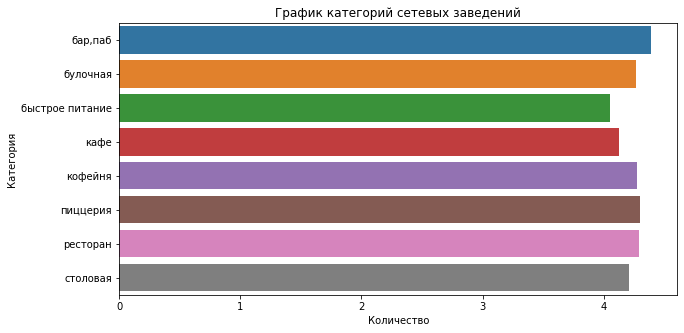

In [ ]:
# выделяем средние рейтинги по категориям
data_rating = data.pivot_table(index = 'category', values = 'rating', aggfunc = 'mean').reset_index()
display(data_rating)
# Строим график категорий сетевых заведений:
plt.figure(figsize=(10, 5)) # Размер графика
plt.title('График категорий сетевых заведений') # Название графика
sns.barplot(x='rating', y='category', data=data_rating).set(ylabel='Категория', xlabel='Количество')
plt.show()
#plot_dr = 
#sns.barplot(x = 'category', y = 'rating', data = data_rating)
#plot_dr.show

Вывод: Средние значения рейтингов значительно не отличаются.

Строим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [ ]:
# получаем средний рейтинг по районам:
data_district_rating = data.pivot_table(index = 'district', values = 'rating', aggfunc = 'mean').reset_index()
display(data_district_rating)

,district,rating
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181647
2,Северный административный округ,4.239822
3,Северо-Восточный административный округ,4.147978
4,Северо-Западный административный округ,4.208802
5,Центральный административный округ,4.377520
6,Юго-Восточный административный округ,4.101120
7,Юго-Западный административный округ,4.172920
8,Южный административный округ,4.184417


In [ ]:
# строим хороплет
from folium import Map, Choropleth
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Отображаем все заведения датасета на карте с помощью кластеров

In [ ]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Находим топ-15 улиц по количеству заведений. Строим график распределения количества заведений и их категорий по этим улицам. 

In [ ]:
#получаем 15 улиц с максимальным количеством заведений
top15_street_count = data.pivot_table(index = 'street', values = 'name', aggfunc = 'count').sort_values(by = 'name', ascending = False).reset_index()[:15]
# выполняем срез и формируем список по топ-15 улицам:
top15_street_category = data.query('street in @top15_street_count.street').pivot_table(index = ['street', 'category'], values = 'name', aggfunc = 'count').sort_values(by = 'street').reset_index()
#строим график:
px.bar(top15_street_category, x='name', y = 'street', color = 'category').show()
top15_street_count.columns = ['Улица', 'Количество заведений'] # Изменяем названия столбцов
display(top15_street_count) #выводим список



,Улица,Количество заведений
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


Находим улицы, на которых находится только один объект общепита.

In [ ]:
data_notop_street = data.pivot_table(index = ['street'], values = 'name', aggfunc = 'count').reset_index().query('name == 1')
data_notop_street.columns = ['Улица', 'Количество объектов'] # Заменяем названия столбцов
print('Количество улиц с одним объектом общественного питания составляет', len(data_notop_street))
display(data_notop_street.head()) #выводим список улиц с одним заведением

Количество улиц с одним объектом общественного питания составляет 458


,Улица,Количество объектов
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1


Вывод: Всего на 458 улицах

Строим хороплет по средним чекам в зависимости от района

In [ ]:
data_middle_avg_bill = data.pivot_table(index = 'district', values = 'middle_avg_bill', aggfunc = 'median').reset_index()
display(data_middle_avg_bill)

,district,middle_avg_bill
0,Восточный административный округ,450.0
1,Западный административный округ,625.0
2,Северный административный округ,550.0
3,Северо-Восточный административный округ,475.0
4,Северо-Западный административный округ,650.0
5,Центральный административный округ,900.0
6,Юго-Восточный административный округ,400.0
7,Юго-Западный административный округ,450.0
8,Южный административный округ,600.0


In [ ]:
# строим хороплет
from folium import Map, Choropleth
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
dm = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек по районам',
).add_to(dm)

# выводим карту
dm

Вывод: Ожидаемо самый высокий средний чек в центральном округе, далее следует северо-запад.

# 4. Детализируем исследование: открытие кофейни.

Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [ ]:
print('Количество кофеен:', len(data.query('category == "кофейня"')))

Количество кофеен: 1413


In [ ]:
data_coffee = data.query('category == "кофейня"') #выполняем срез по кофейням
# считаем сколько кофеен по округам:
data_coffee_count = data_coffee.pivot_table(index = 'district', values = 'category', aggfunc = 'count').sort_values(by = 'category', ascending = False).reset_index()
display(data_coffee_count)

,district,category
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [ ]:
# строим хороплет по расположению кофеен
from folium import Map, Choropleth
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
d = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_coffee_count,
    columns=['district', 'category'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Количество кофеен',
).add_to(d)

# выводим карту
d

Вывод: Подавляющее количество кафеен находится в центральном округе.

Есть ли круглосуточные кофейни?

In [ ]:
data_coffee.groupby('is_24/7')['category'].count()

is_24/7
False    1354
True       59
Name: category, dtype: int64

Вывод: Из списка кофеен всего 59 круглосуточных или около 4%.

Смотрим на рейтинги кофеен по округам

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.2
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


<AxesSubplot:xlabel='category', ylabel='rating'>

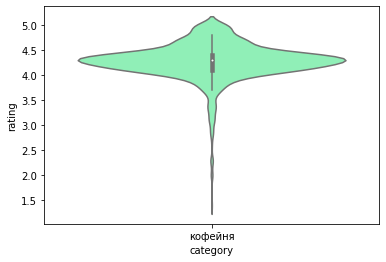

In [ ]:
# выполняем группировку медианного рейтинга по округам:
data_coffee_distr = data_coffee.groupby('district')['rating'].median().reset_index()
display(data_coffee_distr)
sns.violinplot(x = 'category', y = 'rating', data = data_coffee, palette = 'rainbow')

Вывод: Медиана рейтингов по округам практически не отличается. 

Вычисляем среднюю чашку капучино

In [ ]:
# заполняем медианой пропущенные значения цены чашки капучино по названию сети:
data_coffee['middle_coffee_cup'] = data_coffee['middle_coffee_cup'].fillna(data_coffee.groupby('name')['middle_coffee_cup'].transform('median'))
# оставшиеся пропущенные значения заполняем медианным хначением по району
data_coffee['middle_coffee_cup'] = data_coffee['middle_coffee_cup'].fillna(data_coffee.groupby('district')['middle_coffee_cup'].transform('median'))
# удаляем незаполненные пропущенные значения:
data_coffee = data_coffee.dropna(subset = ['middle_coffee_cup'])
print('Максимальная цена чашки капучино:', data_coffee['middle_coffee_cup'].max())
print('Средняя цена чашки капучино:', data_coffee['middle_coffee_cup'].median())
print('Минимальная цена чашки капучино:', data_coffee['middle_coffee_cup'].min())


Максимальная цена чашки капучино: 1568.0
Средняя цена чашки капучино: 157.5
Минимальная цена чашки капучино: 60.0


/tmp/ipykernel_48/102898467.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_48/102898467.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



В максимальной цене за чашку капучино обнаруживается выброс, который будет влиять на исследование, его нужно удалить.

In [ ]:
data_coffee = data_coffee[data_coffee['middle_coffee_cup'] != 1568.0]
display(data_coffee.head())

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,325.0,170.0,нет,NaN,улица Маршала Федоренко,False
25,25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,325.0,150.0,да,NaN,парк Левобережный,False
45,45,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,325.0,127.0,да,46.0,Коровинское шоссе,False
46,46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,325.0,95.0,да,NaN,улица Маршала Федоренко,False
52,52,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,325.0,60.0,да,NaN,улица Дыбенко,False


,median,max
district,,
Юго-Восточный административный округ,126.0,375.0
Центральный административный округ,185.0,328.0
Северный административный округ,150.0,325.0
Западный административный округ,165.0,300.0
Северо-Восточный административный округ,157.5,297.0
Юго-Западный административный округ,162.5,291.0
Южный административный округ,144.0,275.0
Северо-Западный административный округ,135.0,270.0
Восточный административный округ,134.5,256.0


<AxesSubplot:title={'center':'График медианной и максимальной средней цены чашки капучино'}, xlabel='district'>

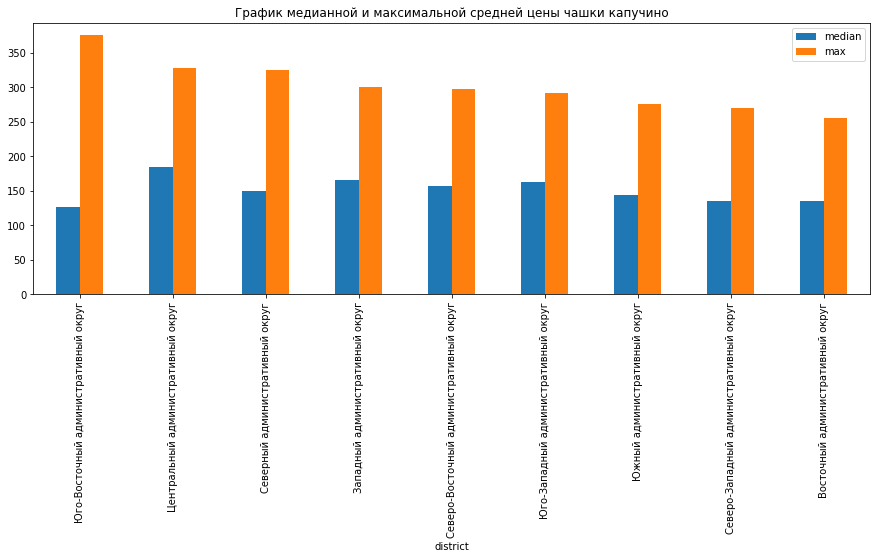

In [ ]:
# получаем среднюю и максимальную цену чашки капучино по районам:
data_coffee_cup = data_coffee.pivot_table(index = 'district', values = 'middle_coffee_cup', aggfunc = ['median', 'max'])#.reset_index()
data_coffee_cup = data_coffee_cup.droplevel(1, axis=1).rename_axis(None, axis=1).sort_values(by = 'max', ascending = False)#.reset_index()
display(data_coffee_cup)
# выводим график медианной и максимальной цены чашки капучино
#plt.figure(figsize=(20, 4))
data_coffee_cup.plot.bar(figsize=(15, 5), title = 'График медианной и максимальной средней цены чашки капучино')

<a id="num3"></a>
 # Выводы
В ходе анализа рынока заведений общественного питания Москвы были выявлены следующие особенности:
* Основную долю рынка общественного питания в Москве занимают:
    * __Кафе__ - 28,3%
    * __Рестораны__ - 24.3%
    * __Кофейни__ - 16.8%
* На остальные виды объектов общественного питания приходится 30,6%.
* Наибольшее количество посадочных мест занимают следующие категории:
    * __Рестораны__ - 28,5%
    * __Кафе__ - 24.2%
    * __Кофейни__ - 17.6%
    * __Бары и пабы__ - 10.6%
    * __Остальные__  - 10.6% занимают пиццерии, быстрое питание, столовые и булочные
* К основным сетвым заведениям относятся объекты общественого питания:
    * __Кафе__ - 28,3%
    * __Рестораны__ - 24,7%
    * __Кофейни__ - 16,8%
    * __Бары и пабы__ - 9,1%

* Для сетевых заведений наиболее характерно: __расположение в центральном округе__
* Наибольшее количество объектов питания располагается на __Проспекте Мира__ - здесь располагается __134 объекта__ общественного питания
* Самый высокий рейтинг заведений относится к Центральному - __4,37__, далее идет Северный - __4,23.__
* Самый высокий средний чек у Центрального округа - __900 р.__, далее идет Северо-западный - __650 р.__, самый низкий средний чек у Юговосточного округа - __400 р.__
* Всего на Москву приходится __1413__ кофеен, из них __59 (4%)__ круглосуточных.
* Наибольшее количество кофеен находится в Центральном округе - __428 шт. (30%)__, наименьшее количество находится в Северо-западном округе - __62 шт. (4%)__.
* Средний рейтинг кофеен от района к району не отличается и составляет __4,3__.
* Общее количество улиц с одним заведением общественного питания - __458__.


# Презентация: [Скачать](https://drive.google.com/file/d/1qpHwr1UuJ1tk8wfeCkID61E8FpWuYvdm/view?usp=share_link)